In [1]:
import torch
from PIL import Image
import numpy as np

In [27]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [2]:
img = Image.open('grid_0_640_N (1).webp').convert("RGB")

In [3]:
img.width, img.height

(640, 935)

In [4]:
def img2tensor(img:Image.Image):
    return torch.tensor(np.array(img,dtype=np.float64)/255)

def tensor2img(tensor:torch.Tensor):
    return Image.fromarray(np.uint8(tensor*255))

In [5]:
img_tensor = img2tensor(img)

In [6]:
img_target = torch.rand(img_tensor.shape)
img_target

tensor([[[0.2694, 0.9346, 0.9687],
         [0.6530, 0.2135, 0.3172],
         [0.8986, 0.7915, 0.3908],
         ...,
         [0.1603, 0.6569, 0.3609],
         [0.8360, 0.2817, 0.7075],
         [0.5365, 0.4825, 0.7234]],

        [[0.1697, 0.4032, 0.0724],
         [0.2972, 0.8066, 0.4219],
         [0.1511, 0.6417, 0.2583],
         ...,
         [0.0260, 0.1541, 0.5573],
         [0.2051, 0.5253, 0.5088],
         [0.7907, 0.3618, 0.7291]],

        [[0.4363, 0.1908, 0.3864],
         [0.3722, 0.6271, 0.7569],
         [0.2970, 0.1754, 0.4554],
         ...,
         [0.5430, 0.3294, 0.4831],
         [0.8147, 0.0011, 0.7675],
         [0.9147, 0.9737, 0.7816]],

        ...,

        [[0.4656, 0.2037, 0.1561],
         [0.7045, 0.4384, 0.7709],
         [0.3728, 0.2917, 0.8836],
         ...,
         [0.2829, 0.8839, 0.1871],
         [0.2822, 0.2124, 0.0493],
         [0.0428, 0.2476, 0.6944]],

        [[0.6932, 0.3058, 0.1933],
         [0.1327, 0.4864, 0.0897],
         [0.

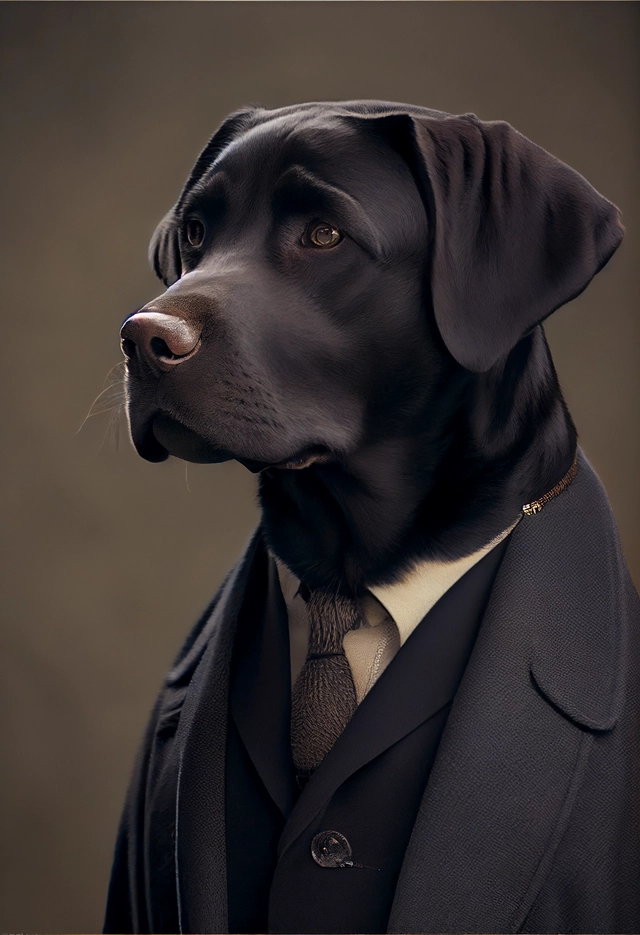

In [7]:
im = tensor2img(img_tensor)
im

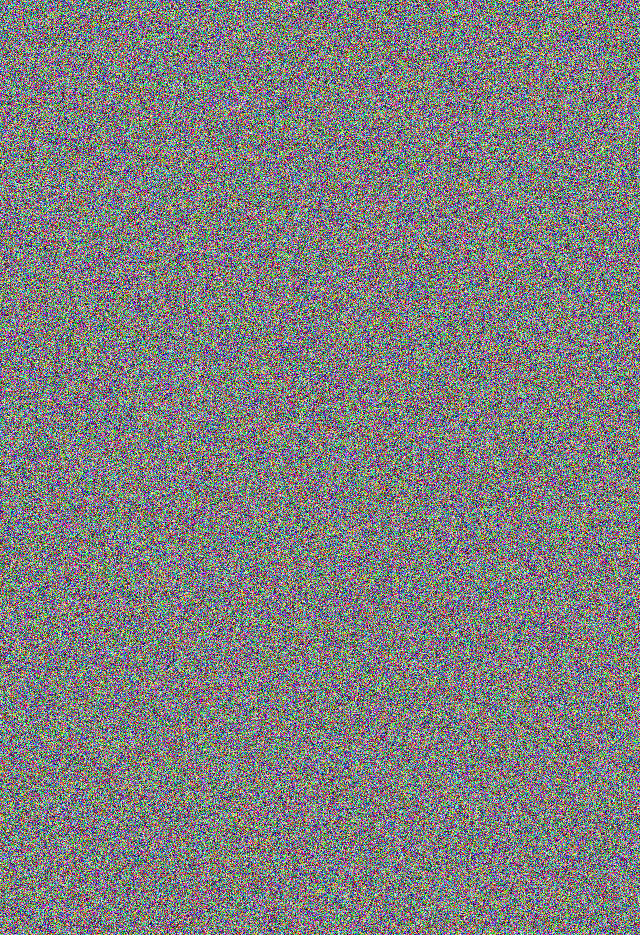

In [8]:
im = tensor2img(img_target)
im

In [9]:
class Model(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.lin1 = torch.nn.Linear(640*935*3)

In [10]:
parameters = torch.randn(img_tensor.shape, requires_grad=True)
parameters

tensor([[[ 0.1761,  0.3504, -0.9641],
         [-0.5297,  0.0137,  0.7783],
         [ 0.8542, -1.7138, -0.5115],
         ...,
         [ 0.0541, -1.5521, -0.9541],
         [-1.3224, -0.6454,  1.3467],
         [-0.9977, -1.2030,  1.1365]],

        [[ 0.2237,  0.1277,  1.2742],
         [ 0.2953,  0.1664,  1.5473],
         [ 1.3502,  0.2454,  0.0942],
         ...,
         [ 0.1494, -0.5822, -0.5047],
         [ 0.7305, -0.8727, -0.3855],
         [ 1.5599, -1.3005,  1.1767]],

        [[ 1.4758,  0.0334, -0.5187],
         [-1.6913,  0.1951,  0.2374],
         [ 0.9269, -0.7271, -1.5138],
         ...,
         [-0.7049, -1.5423,  0.4714],
         [-0.7208, -0.7258, -1.2769],
         [ 0.7639,  0.8513, -0.4609]],

        ...,

        [[-1.0553, -1.5757,  0.2257],
         [ 0.7119,  1.1480, -1.0984],
         [-0.5721,  0.0039,  0.1983],
         ...,
         [-0.6804, -0.0420, -0.8228],
         [ 0.3479, -1.6311,  0.1974],
         [ 0.7472,  0.3567, -1.5562]],

        [[

In [11]:
img_target.requires_grad=False

In [28]:
lr=1e-2
loss_fn = torch.nn.MSELoss(reduction='sum')
for t in range(2000):
    img_pred = parameters * img_target
    loss = (img_pred-img_tensor).pow(2).sum()
    loss.backward()
    with torch.no_grad():
        parameters -= lr*parameters.grad
        parameters.grad = torch.zeros_like(parameters)

In [19]:
parameters

tensor([[[ 1.4980,  0.4112,  0.3562],
         [ 0.6426,  1.5020,  1.0705],
         [ 0.4626,  0.4757,  0.8601],
         ...,
         [ 1.5055,  0.5134,  0.8060],
         [ 0.4456,  1.1498,  0.4213],
         [ 0.6432,  0.6582,  0.3740]],

        [[ 0.8171,  0.3790,  1.3721],
         [ 0.6238,  0.1945,  0.3169],
         [ 1.2402,  0.2261,  0.4311],
         ...,
         [ 0.2961,  0.2329,  0.1407],
         [ 0.7274,  0.2239,  0.1618],
         [ 0.1637,  0.2631,  0.0914]],

        [[ 0.4409,  0.6729,  0.4240],
         [ 0.4977,  0.2564,  0.2124],
         [ 0.6548,  0.4591,  0.3613],
         ...,
         [ 0.3106,  0.4160,  0.2760],
         [ 0.2022, -0.7194,  0.1686],
         [ 0.1758,  0.1369,  0.1606]],

        ...,

        [[ 0.5388,  0.5359,  0.8401],
         [ 0.3284,  0.4387,  0.2187],
         [ 0.6268,  0.6509,  0.1953],
         ...,
         [ 0.3462,  0.1109,  0.3243],
         [ 0.2940,  0.0158,  0.3725],
         [ 0.8116,  0.2331,  0.1242]],

        [[

In [41]:
img_target

tensor([[[0.4711, 0.9059, 0.9835],
         [0.4679, 0.2564, 0.7259],
         [0.4400, 0.5681, 0.6199],
         ...,
         [0.1804, 0.4861, 0.0912],
         [0.7309, 0.5968, 0.8002],
         [0.4390, 0.4310, 0.4063]],

        [[0.2902, 0.9925, 0.2410],
         [0.7851, 0.4204, 0.3265],
         [0.5946, 0.6076, 0.8544],
         ...,
         [0.4295, 0.4690, 0.0041],
         [0.1573, 0.1600, 0.1808],
         [0.7697, 0.9020, 0.2122]],

        [[0.5863, 0.8972, 0.7994],
         [0.9514, 0.9213, 0.6067],
         [0.2794, 0.6897, 0.1678],
         ...,
         [0.6329, 0.2673, 0.1819],
         [0.6974, 0.6254, 0.8348],
         [0.6440, 0.2925, 0.7859]],

        ...,

        [[0.3062, 0.9225, 0.8157],
         [0.9317, 0.9446, 0.7308],
         [0.9200, 0.7132, 0.9280],
         ...,
         [0.5081, 0.4715, 0.9954],
         [0.4039, 0.2155, 0.7357],
         [0.3015, 0.0031, 0.4136]],

        [[0.6929, 0.2775, 0.3357],
         [0.6826, 0.1952, 0.7001],
         [0.

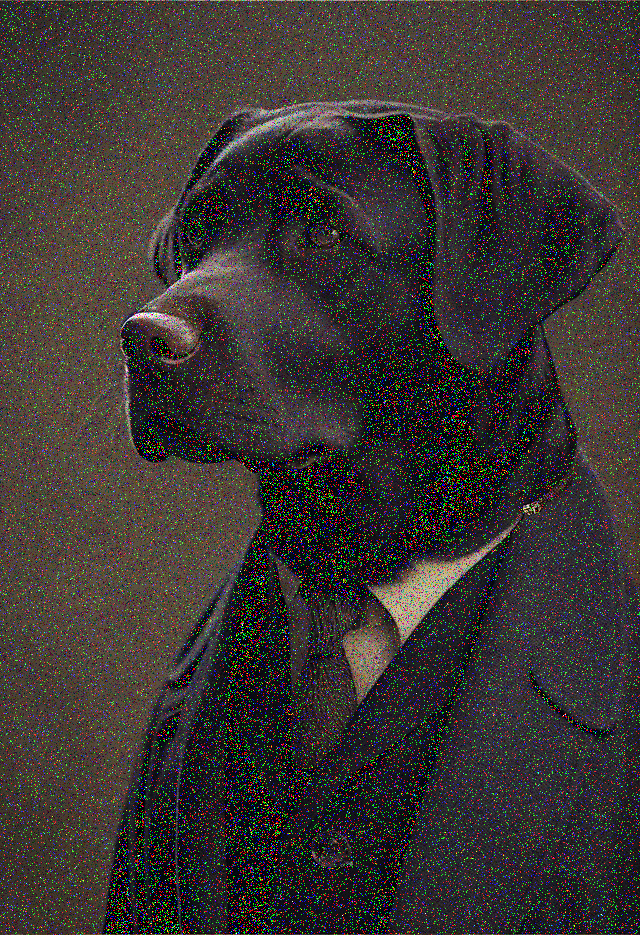

In [20]:
im = tensor2img((img_target*parameters).detach().numpy())
im

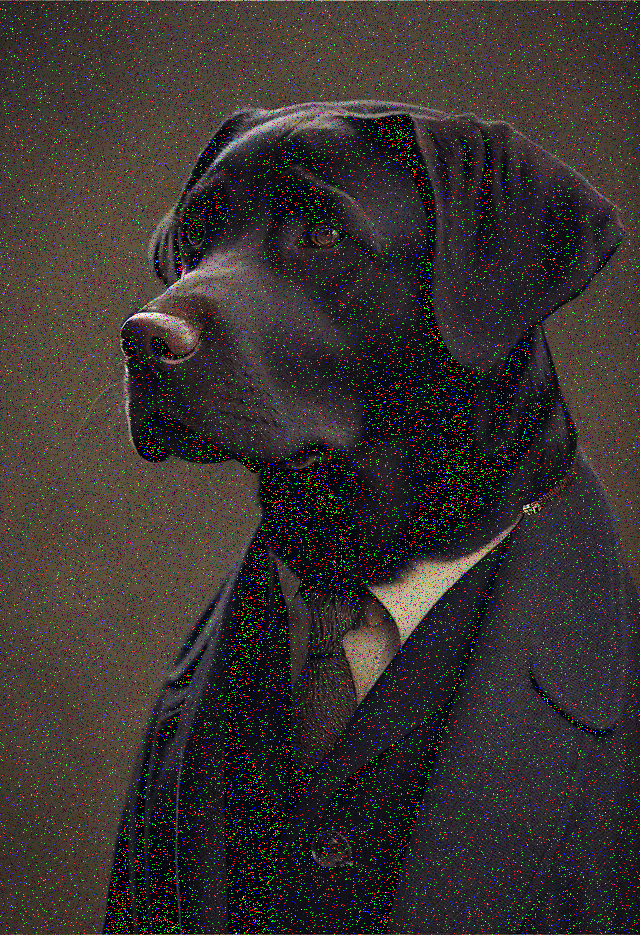

In [22]:
im = tensor2img((img_target*parameters).detach().numpy())
im

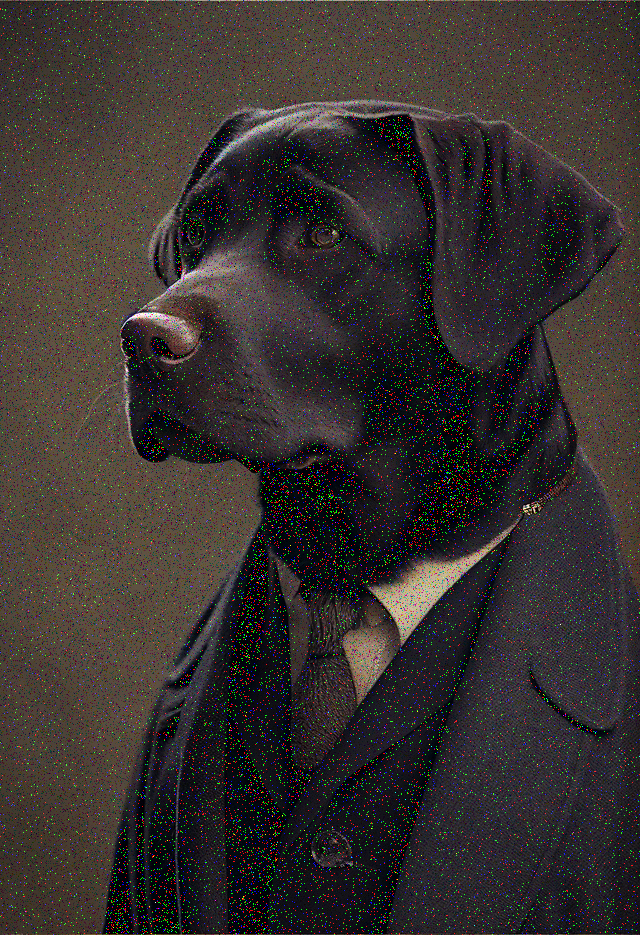

In [24]:
im = tensor2img((img_target*parameters).detach().numpy())
im

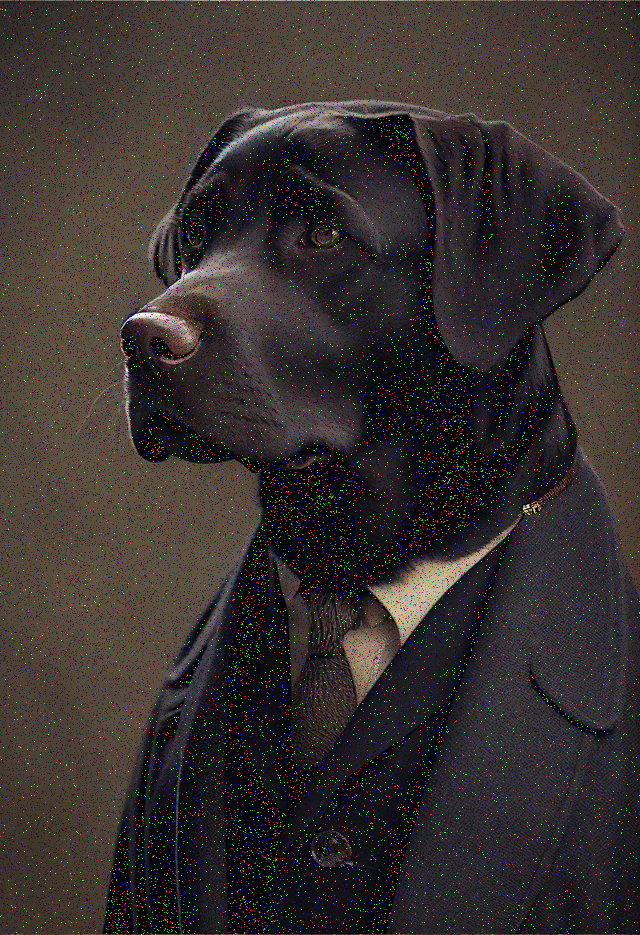

In [26]:
im = tensor2img((img_target*parameters).detach().numpy())
im

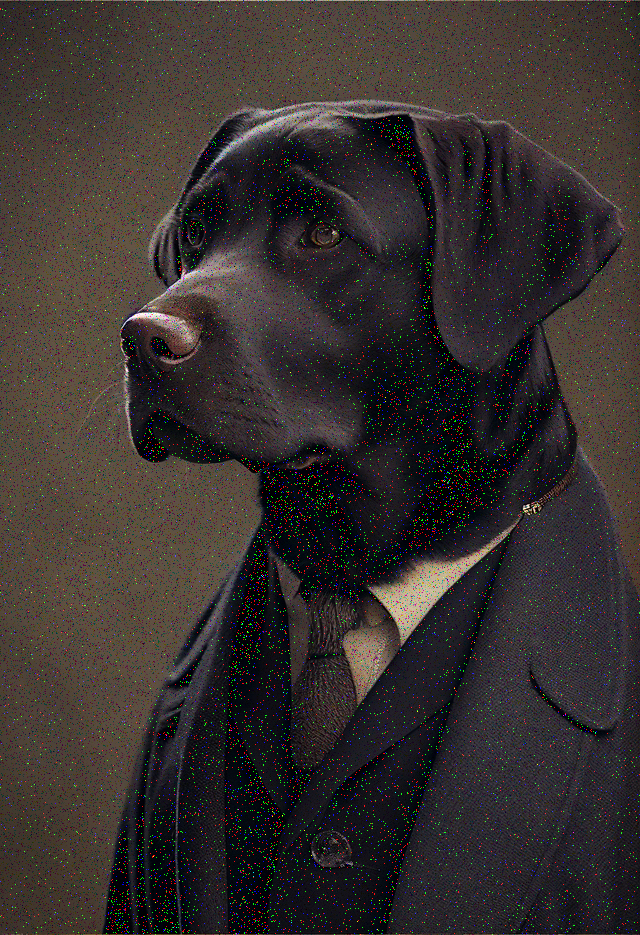

In [29]:
im = tensor2img((img_target*parameters).detach().numpy())
im